# Blurring and Smoothing

### info link on Blurring Math 

http://people.csail.mit.edu/sparis/bf_course/

https://setosa.io/ev/image-kernels/

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [6]:
def load_img():
    img = cv2.imread('../DATA/bricks.jpg').astype(np.float32)/255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [7]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

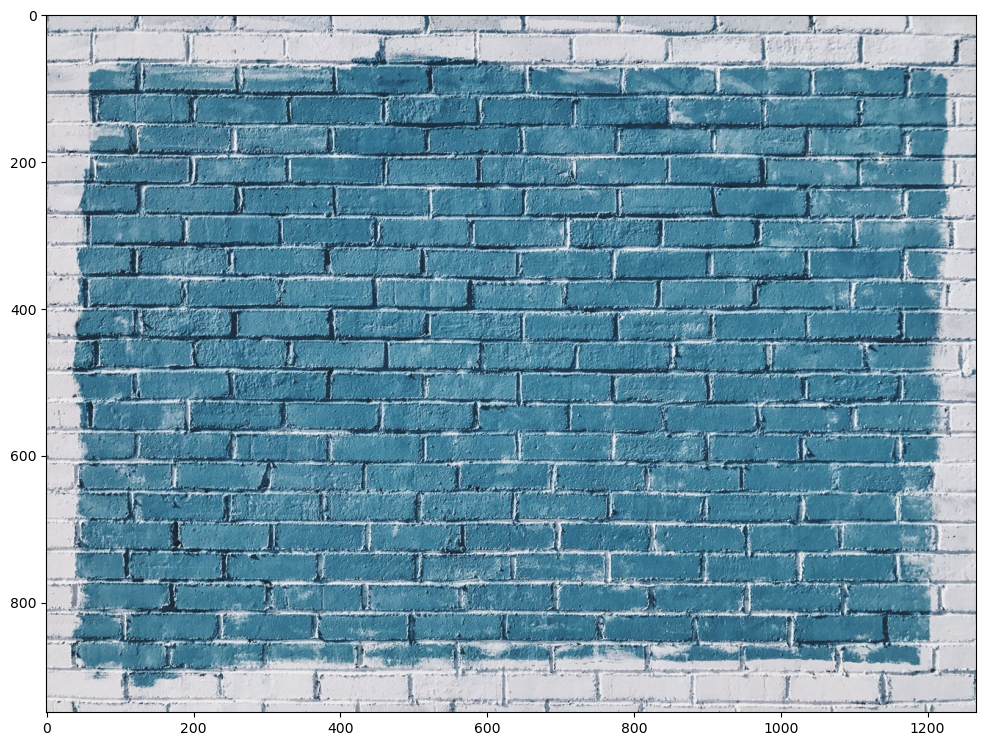

In [8]:
i = load_img()
display_img(i)

# Gamma Correction

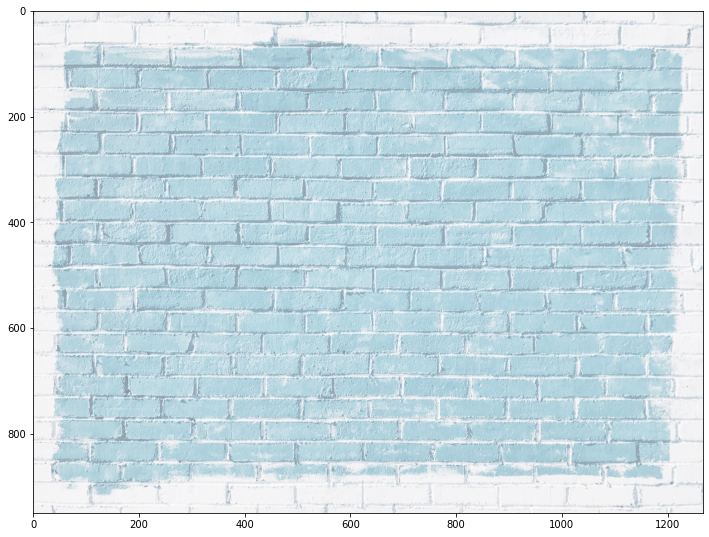

In [6]:
img = load_img()
gamma = 1/4
effected_img = np.power(img,gamma)
display_img(effected_img)

In [10]:
img[0,0][0]**.5

0.8900319517486518

In [11]:
img.shape

(950, 1267, 3)

In [12]:
img[200:205,200:205]

array([[[0.6745098 , 0.7254902 , 0.7607843 ],
        [0.8627451 , 0.8980392 , 0.93333334],
        [0.83137256, 0.88235295, 0.91764706],
        [0.49019608, 0.5921569 , 0.6509804 ],
        [0.34509805, 0.5058824 , 0.5921569 ]],

       [[0.78431374, 0.8352941 , 0.87058824],
        [0.827451  , 0.84705883, 0.87058824],
        [0.9411765 , 0.9764706 , 1.        ],
        [0.44705883, 0.53333336, 0.58431375],
        [0.25882354, 0.4       , 0.4862745 ]],

       [[0.7411765 , 0.78039217, 0.81960785],
        [0.7882353 , 0.8       , 0.81960785],
        [0.9490196 , 0.96862745, 0.9843137 ],
        [0.4117647 , 0.48235294, 0.5294118 ],
        [0.23529412, 0.37254903, 0.4509804 ]],

       [[0.7411765 , 0.7921569 , 0.827451  ],
        [0.87058824, 0.88235295, 0.9019608 ],
        [0.9254902 , 0.94509804, 0.9607843 ],
        [0.5647059 , 0.627451  , 0.6784314 ],
        [0.34901962, 0.4745098 , 0.5647059 ]],

       [[0.7019608 , 0.7490196 , 0.79607844],
        [0.9137255 , 0.933

In [13]:
effected_img[200:205,200:205]

array([[[0.4549635 , 0.5263361 , 0.5787928 ],
        [0.7443291 , 0.80647445, 0.8711111 ],
        [0.69118035, 0.77854675, 0.8420761 ],
        [0.24029219, 0.35064977, 0.4237755 ],
        [0.11909267, 0.25591698, 0.35064977]],

       [[0.61514807, 0.6977163 , 0.7579239 ],
        [0.68467516, 0.7175087 , 0.7579239 ],
        [0.8858132 , 0.9534948 , 1.        ],
        [0.1998616 , 0.28444448, 0.34142256],
        [0.06698963, 0.16000001, 0.2364629 ]],

       [[0.5493426 , 0.60901195, 0.67175704],
        [0.6213149 , 0.64000005, 0.67175704],
        [0.9006382 , 0.93823916, 0.9688735 ],
        [0.16955018, 0.23266436, 0.28027683],
        [0.05536332, 0.13879278, 0.20338331]],

       [[0.5493426 , 0.6275125 , 0.68467516],
        [0.7579239 , 0.77854675, 0.81353325],
        [0.8565321 , 0.8932103 , 0.9231065 ],
        [0.31889278, 0.39369476, 0.46026915],
        [0.12181469, 0.22515956, 0.31889278]],

       [[0.49274898, 0.5610304 , 0.6337409 ],
        [0.8348943 , 0.871

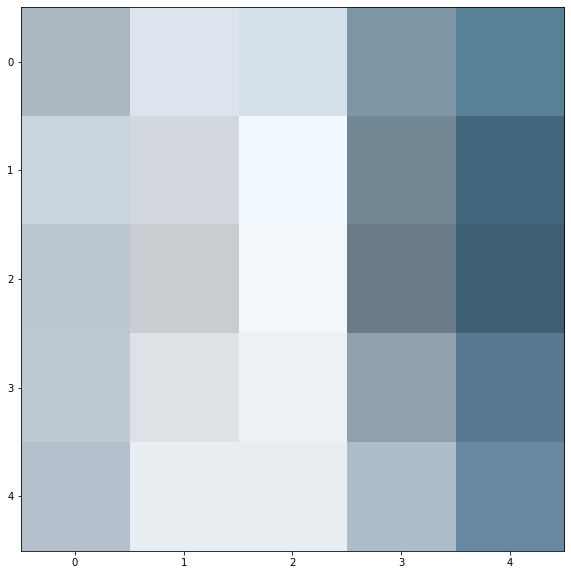

In [14]:
display_img(img[200:205,200:205])

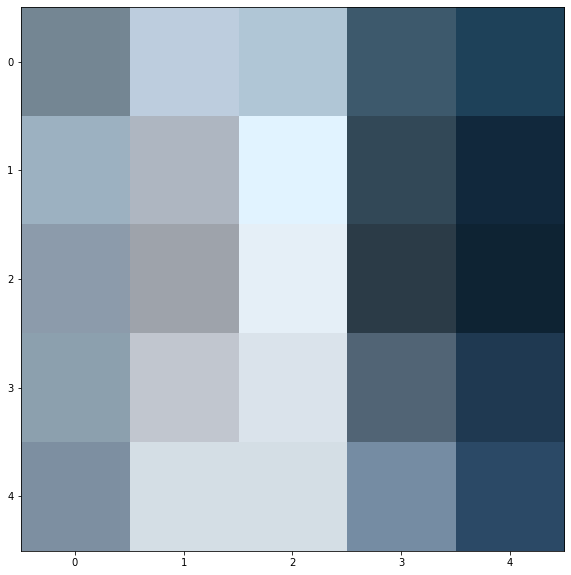

In [15]:
display_img(np.power(img[200:205,200:205],2))

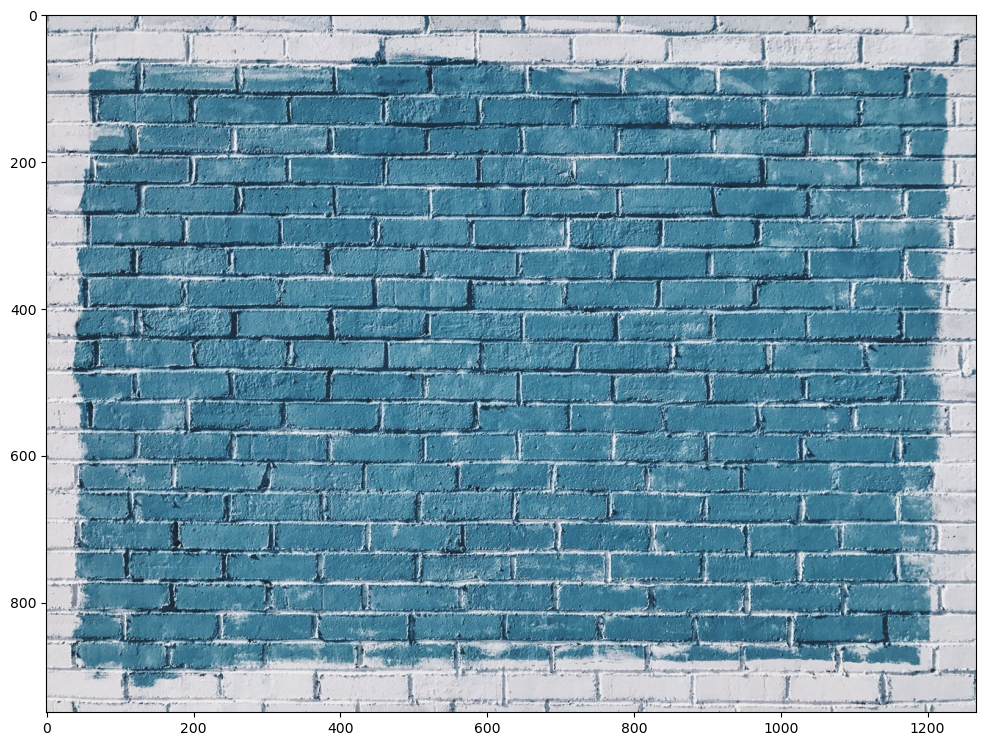

In [11]:
img = load_img()
gamma = 1
effected_img = np.power(img,gamma)
display_img(effected_img)

# Low Pass Filter with 2D Convolution

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


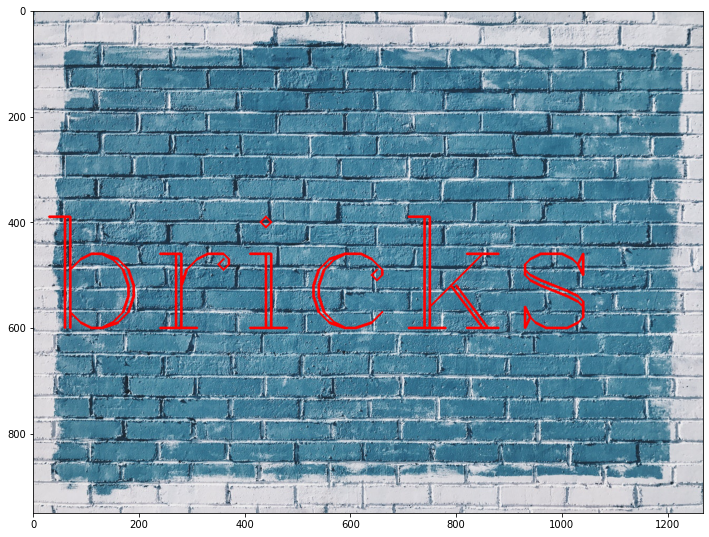

In [16]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600),fontFace=font, fontScale=10,color=(255,0,0),thickness=4)
display_img(img)

# Create the Kernel

In [17]:
kernel = np.ones(shape=(5,5),dtype=np.float32)/50

In [18]:
kernel

array([[0.02, 0.02, 0.02, 0.02, 0.02],
       [0.02, 0.02, 0.02, 0.02, 0.02],
       [0.02, 0.02, 0.02, 0.02, 0.02],
       [0.02, 0.02, 0.02, 0.02, 0.02],
       [0.02, 0.02, 0.02, 0.02, 0.02]], dtype=float32)

In [19]:
img.shape

(950, 1267, 3)

$\texttt{dst} (x,y) =  \sum _{ \stackrel{0\leq x' < \texttt{kernel.cols},}{0\leq y' < \texttt{kernel.rows}} }  \texttt{kernel} (x',y')* \texttt{src} (x+x'- \texttt{anchor.x} ,y+y'- \texttt{anchor.y} )$

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


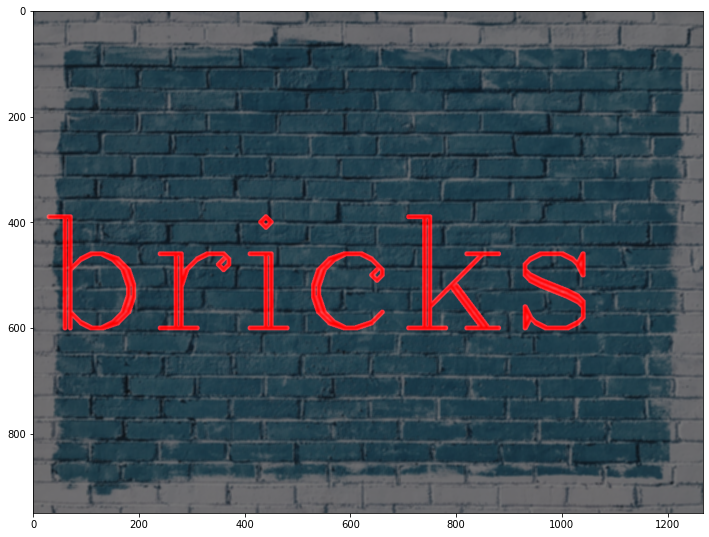

In [20]:
dst = cv2.filter2D(img,-1,kernel)
display_img(dst)

In [21]:
dst.shape

(950, 1267, 3)

# Averaging

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


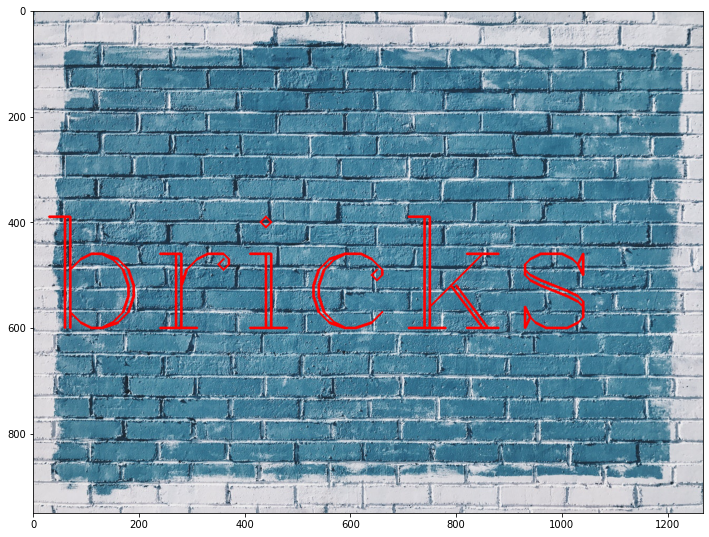

In [22]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600),fontFace=font, fontScale=10,color=(255,0,0),thickness=4)
display_img(img)

In [23]:
bluring_img = cv2.blur(img,ksize=(5,5))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


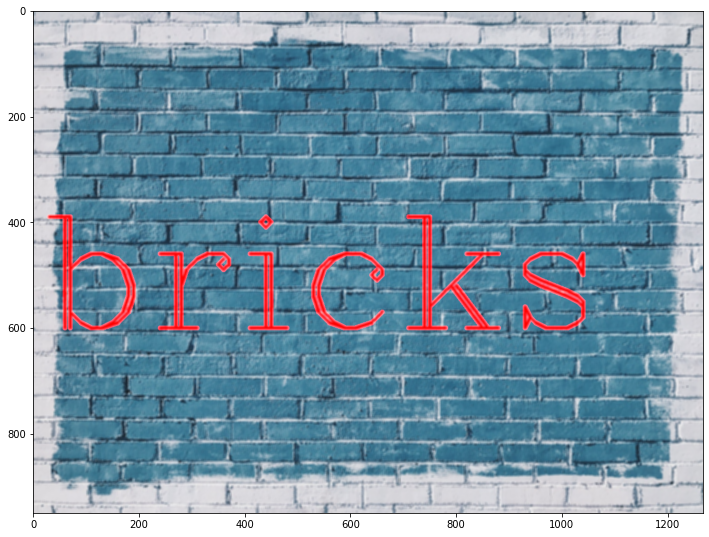

In [24]:
display_img(bluring_img)

# Gaussian Bluring

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


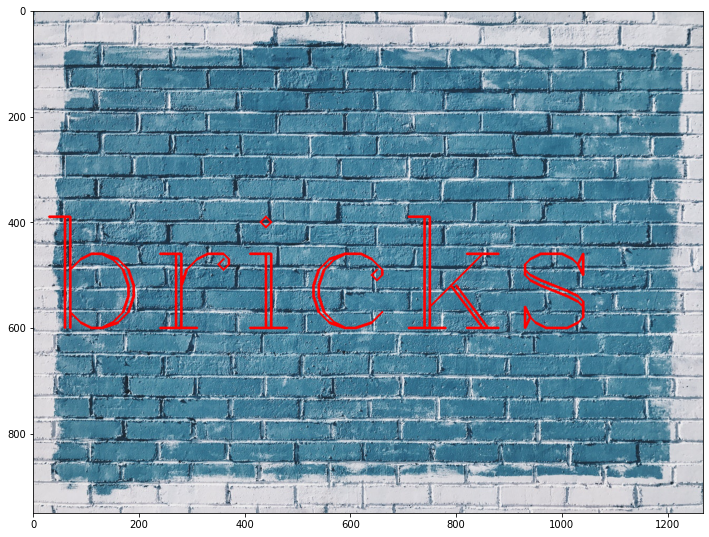

In [25]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600),fontFace=font, fontScale=10,color=(255,0,0),thickness=4)
display_img(img)

In [26]:
blurred_img = cv2.GaussianBlur(img,(5,5),10)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


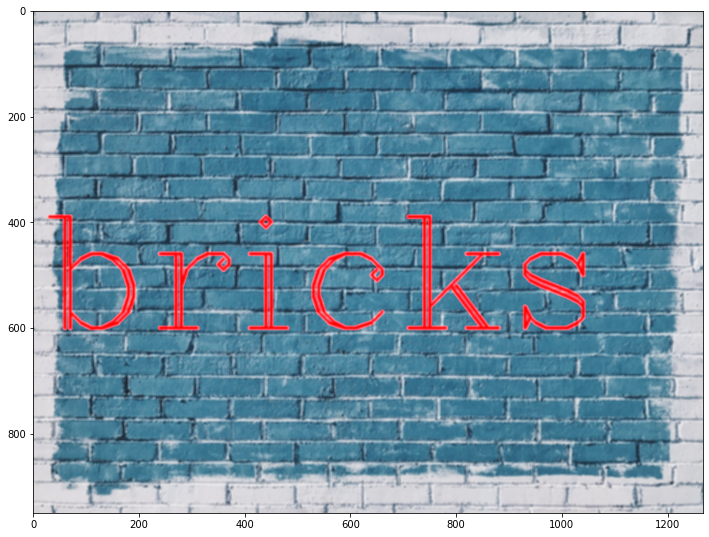

In [27]:
display_img(blurred_img)

# Median Blur

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


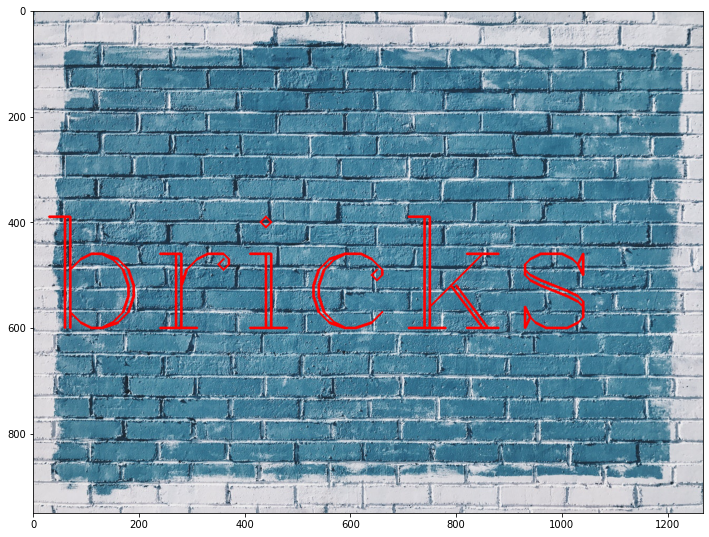

In [28]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600),fontFace=font, fontScale=10,color=(255,0,0),thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


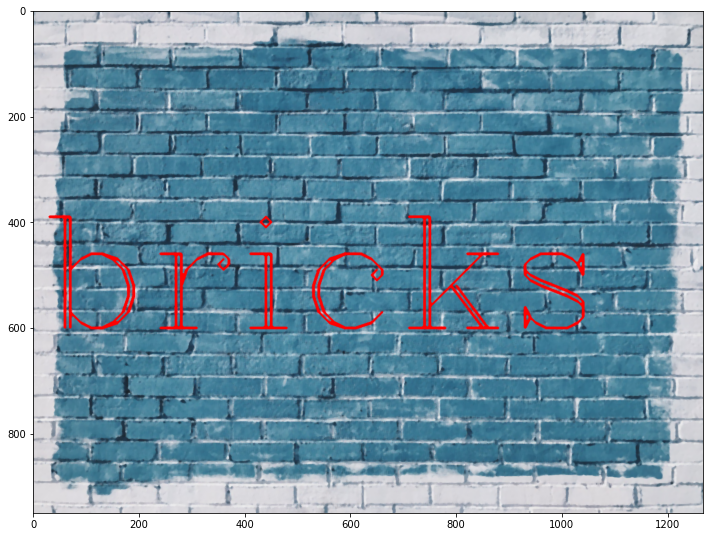

In [29]:
median = cv2.medianBlur(img,5)
display_img(median)

# Adding Noise

In [30]:
img = cv2.imread('../DATA/sammy.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

In [31]:
img.max()

255

In [32]:
img.min()

0

In [33]:
img.mean()

89.33081901499337

In [34]:
img.shape

(1367, 1025, 3)

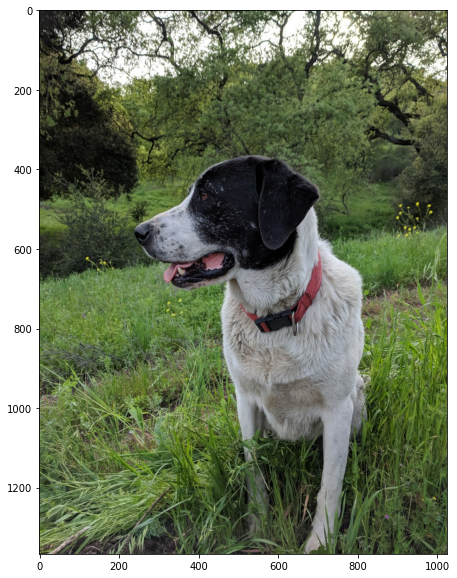

In [35]:
display_img(img)

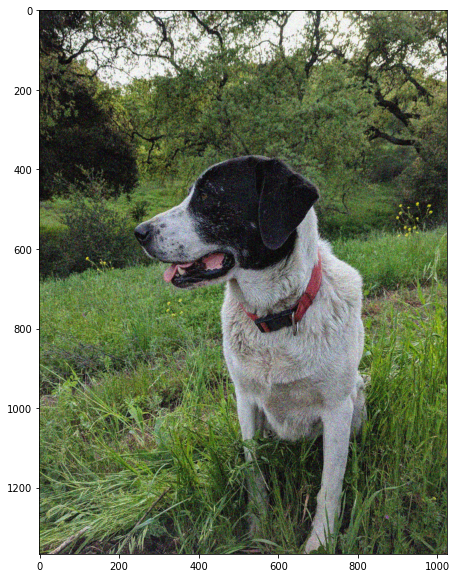

In [36]:
noise_img = cv2.imread('../DATA/sammy_noise.jpg')
display_img(noise_img)

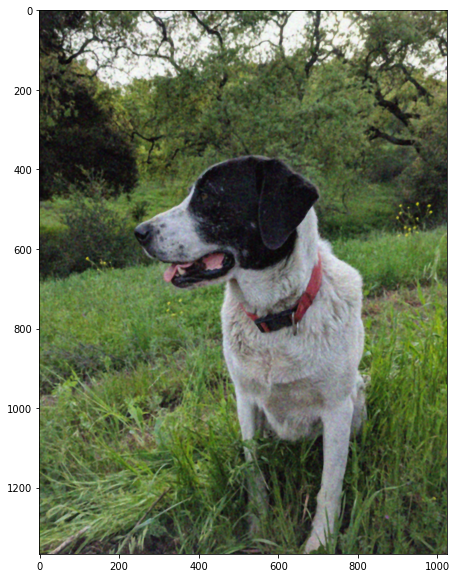

In [37]:
median = cv2.medianBlur(noise_img,5)
display_img(median)

# Bilateral Filteting

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


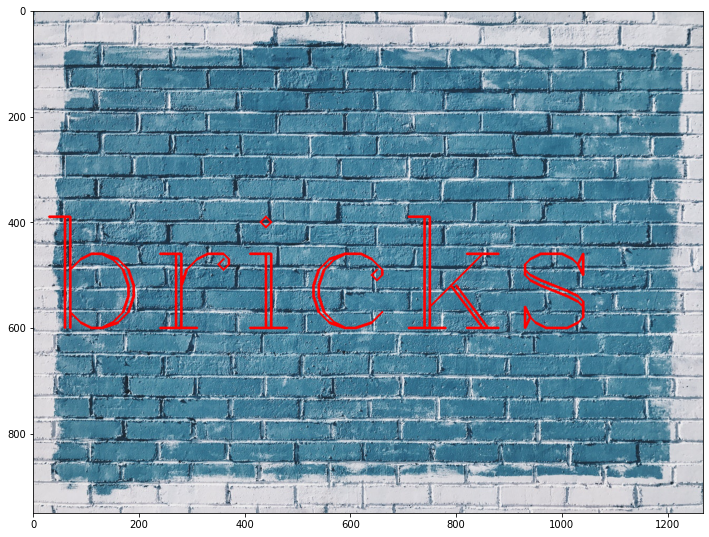

In [38]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text='bricks',org=(10,600),fontFace=font,fontScale=10,color=(255,0,0),thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


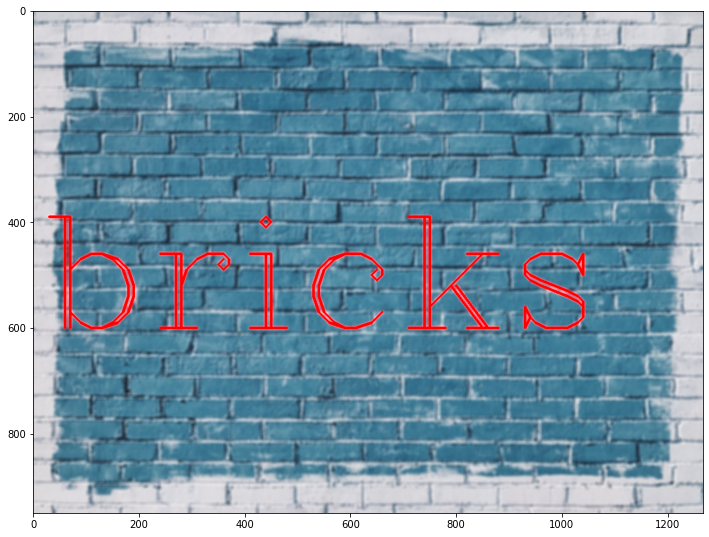

In [39]:
blur = cv2.bilateralFilter(img,9,75,75)
display_img(blur)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


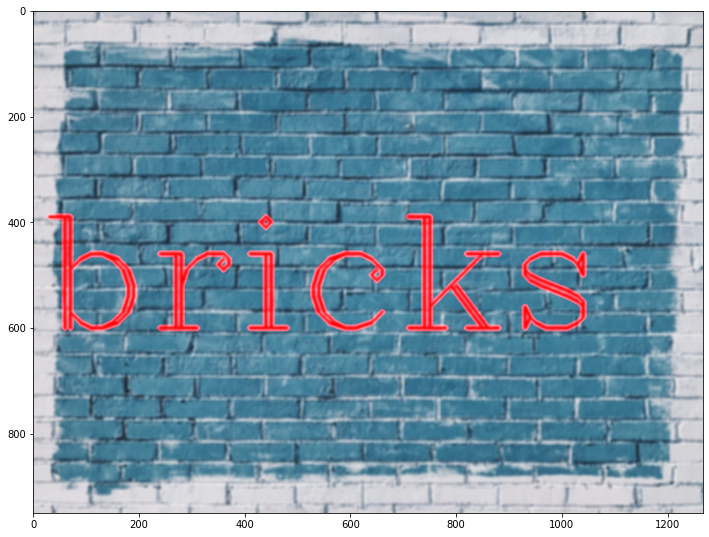

In [40]:
blur = cv2.bilateralFilter(img,9,250,75)
display_img(blur)